# <span style="color:#0694cd"><strong>FarmTech Solutions:</strong></span> <span style="color:#0694cd">Demonstração de Visão Computacional com YOLO</span>
## **Desafio 2**

Comparar modelo treinado com outras tipos de modelo

**Etapas**
1.  **Teste 1:** Farmtech 35 épocas.
2.  **Teste 2:** Farmtech 55 épocas.
3.  **Teste 3:** YOLO Padrão.
4.  **Teste 4:** Torchvision Padrão.

**Observações**
1.  Para este notebook funcionar, é necessário que o notebook do desario 1 seja executado
2.  As colunas da última imagem estão na mesma ordem dos testes

### <span style="color:#dfceb9">**1.** Configuração do Ambiente</span>

#### <span style="color:#57b7b4">**1.1** Definição de diretorios e Criação de variaveis globais</span>

In [9]:
import os, sys

BASE_PATH = os.getcwd()

IMAGES_TRAIN = f'{BASE_PATH}/images/train'
IMAGES_VAL = f'{BASE_PATH}/images/val'
IMAGES_TEST = f'{BASE_PATH}/images/test'

FT_T1_PATH = f'{BASE_PATH}/runs-desafio_1/train/t1_model'
FT_T2_PATH = f'{BASE_PATH}/runs-desafio_1/train/t2_model'

TESTS_PATH = f'{BASE_PATH}/runs-desafio_2/detect'

FT_D1_PATH = f'{TESTS_PATH}/ft_d1_model'
FT_D2_PATH = f'{TESTS_PATH}/ft_d2_model'
YP_D0_PATH = f'{TESTS_PATH}/yp_d0_model'
TV_D0_PATH = f'{TESTS_PATH}/tv_d0_model'

CONFIDENCE = .25

#### <span style="color:#57b7b4">**1.2** Clone de repositorio (YOLOv5)</soan>

In [10]:
YOLO_PATH = '/tmp/yolo'

if os.path.isdir(YOLO_PATH) and YOLO_PATH not in sys.path:
    sys.path.append(YOLO_PATH)

In [11]:
!rm -fr {YOLO_PATH}
!git clone https://github.com/ultralytics/yolov5 {YOLO_PATH}
!python3 -m pip install --no-cache-dir --root-user-action ignore --quiet -r {YOLO_PATH}/requirements.txt
!python3 -m pip install --no-cache-dir --root-user-action ignore --quiet torchvision

Cloning into '/tmp/yolo'...
remote: Enumerating objects: 17413, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 17413 (delta 64), reused 22 (delta 22), pack-reused 17327 (from 4)
Receiving objects: 100% (17413/17413), 16.30 MiB | 30.74 MiB/s, done.
Resolving deltas: 100% (11935/11935), done.


#### <span style="color:#57b7b4">**1.5** Importação de bibliotecas</span>

In [12]:
import matplotlib.pyplot as plt
import PIL as pil
import torch
import torchvision
import torchvision.transforms as T
import utils

In [13]:
_ = utils.notebook_init()

YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.10.15 torch-2.4.0+rocm6.3.4.git7cecbf6d CUDA:0 (AMD Radeon RX 7900 XTX, 24496MiB)


Setup complete ✅ (28 CPUs, 54.9 GB RAM, 113.1/1006.9 GB disk)


### <span style="color:#dfceb9">**2.** Testes (Inferência)</span>

In [14]:
%rm -fr {TESTS_PATH}/*

#### <span style="color:#57b7b4">**2.1** Farmtech - Teste 1 (35 épocas)</span>

In [15]:
!python {YOLO_PATH}/detect.py --weights {FT_T1_PATH}/weights/best.pt --conf {CONFIDENCE} --source {IMAGES_TEST} --name {FT_D1_PATH} --save-txt --save-conf

detect: weights=['/mnt/d/1TIAOR_FIAP_fase6_cap1/runs-desafio_1/train/t1_model/weights/best.pt'], source=/mnt/d/1TIAOR_FIAP_fase6_cap1/images/test, data=../../../tmp/yolo/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../../../tmp/yolo/runs/detect, name=/mnt/d/1TIAOR_FIAP_fase6_cap1/runs-desafio_2/detect/ft_d1_model, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.10.15 torch-2.4.0+rocm6.3.4.git7cecbf6d CUDA:0 (AMD Radeon RX 7900 XTX, 24496MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/16 /mnt/d/1TIAOR_FIAP_fase6_cap1/images/test/a_image_01.jpg: 640x640 1 cachorro, 5.4ms
image 2/16 /mnt/d/1TIAOR_FIA

#### <span style="color:#57b7b4">**2.2** Farmtech - Teste 2 (55 épocas)</span>

In [16]:
!python {YOLO_PATH}/detect.py --weights {FT_T2_PATH}/weights/best.pt --conf {CONFIDENCE} --source {IMAGES_TEST} --name {FT_D2_PATH} --save-txt --save-conf

detect: weights=['/mnt/d/1TIAOR_FIAP_fase6_cap1/runs-desafio_1/train/t2_model/weights/best.pt'], source=/mnt/d/1TIAOR_FIAP_fase6_cap1/images/test, data=../../../tmp/yolo/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../../../tmp/yolo/runs/detect, name=/mnt/d/1TIAOR_FIAP_fase6_cap1/runs-desafio_2/detect/ft_d2_model, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.10.15 torch-2.4.0+rocm6.3.4.git7cecbf6d CUDA:0 (AMD Radeon RX 7900 XTX, 24496MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/16 /mnt/d/1TIAOR_FIAP_fase6_cap1/images/test/a_image_01.jpg: 640x640 1 cachorro, 5.0ms
image 2/16 /mnt/d/1TIAOR_FIA

#### <span style="color:#57b7b4">**2.3** YOLO (Padrão)</span>

In [17]:
!python {YOLO_PATH}/detect.py --weights {YOLO_PATH}/yolov5s.pt --conf {CONFIDENCE} --source {IMAGES_TEST} --name {YP_D0_PATH} --save-txt --save-conf

detect: weights=['/tmp/yolo/yolov5s.pt'], source=/mnt/d/1TIAOR_FIAP_fase6_cap1/images/test, data=../../../tmp/yolo/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../../../tmp/yolo/runs/detect, name=/mnt/d/1TIAOR_FIAP_fase6_cap1/runs-desafio_2/detect/yp_d0_model, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.10.15 torch-2.4.0+rocm6.3.4.git7cecbf6d CUDA:0 (AMD Radeon RX 7900 XTX, 24496MiB)

100%|██████████████████████████████████████| 14.1M/14.1M [00:00<00:00, 61.6MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/16 /mnt/d/1TIAOR_FIAP_fase6_cap1/images/test/a_image_01.jpg: 640x640 1 dog, 5.3ms
imag

#### <span style="color:#57b7b4">**2.4** Torchvision (Padrão)</span>

In [18]:
!rm -fr {TV_D0_PATH}
!mkdir -p {TV_D0_PATH}

In [19]:
def torchvision_detector(images_path, images_output_path, confidence):

    transform = T.Compose([T.ToTensor()])
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    model.eval()

    fx_area = lambda box: (box[2] - box[0]) * (box[3] - box[1])
    output = []

    for image in os.listdir(images_path):
        img = pil.Image.open(f'{images_path}/{image}').convert('RGB')

        with torch.no_grad():
            outputs = model([transform(img)])[0]

        draw = pil.ImageDraw.Draw(img)

        filtered = [
            (box, label, score) \
                for box, label, score in zip(outputs['boxes'], outputs['labels'], outputs['scores']) \
                    if score >= confidence
        ]

        if not filtered:
            continue

        box, label, score = max(filtered, key=lambda x: fx_area(x[0]))

        if label.item() < 18:
            label_name = 'carro'
        else:
            label_name = 'cachorro'

        draw.rectangle(box.tolist(), outline= 'green', width=3)
        draw.text((box[0], box[1]), f"{label_name} ({score:.2f})", fill= 'black')

        img.save(f'{images_output_path}/{image}')

        output.append(round(score.item(), 2))

    return output

### <span style="color:#dfceb9">**3.** Análise de testes</span>

In [20]:
%cd {BASE_PATH}

/mnt/d/1TIAOR_FIAP_fase6_cap1


In [21]:
images = os.listdir(IMAGES_TEST)

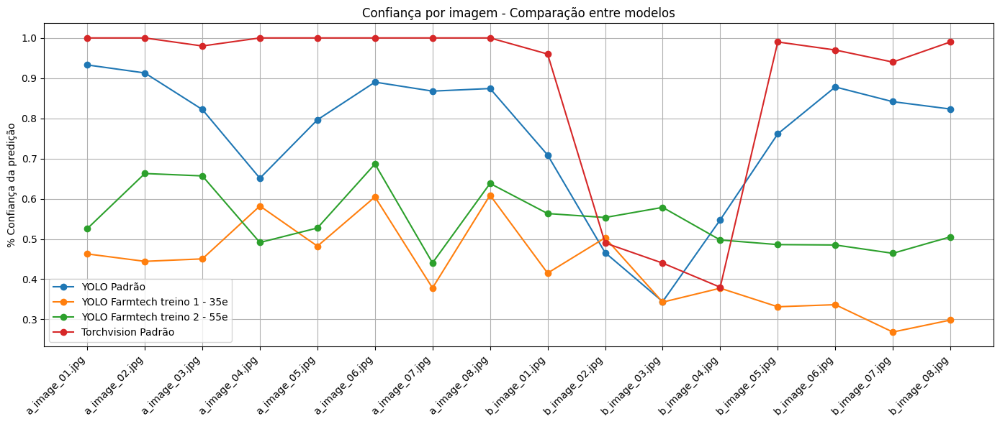

In [22]:
def datacatch(file_path):
    try:
        with open(file_path) as f:
            value = float(f.readline().split(' ')[5])
    except:
        value = 0.0
    return value

farmtech_test_1 = [datacatch(f'{FT_D1_PATH}/labels/{f.replace(".jpg",".txt")}') for f in images]
farmtech_test_2 = [datacatch(f'{FT_D2_PATH}/labels/{f.replace(".jpg",".txt")}') for f in images]
yolo_test_1 = [datacatch(f'{YP_D0_PATH}/labels/{f.replace(".jpg",".txt")}') for f in images]
torchvision_test_1 = torchvision_detector(IMAGES_TEST, TV_D0_PATH, CONFIDENCE)

plt.figure(figsize=(14,6))
plt.plot(images, yolo_test_1, marker='o', label=f'YOLO Padrão')
plt.plot(images, farmtech_test_1, marker='o', label=f'YOLO Farmtech treino 1 - 35e')
plt.plot(images, farmtech_test_2, marker='o', label=f'YOLO Farmtech treino 2 - 55e')
plt.plot(images, torchvision_test_1, marker='o', label=f'Torchvision Padrão')
plt.xticks(rotation= 45, ha= 'right')
plt.ylabel("% Confiança da predição")
plt.title(f"Confiança por imagem - Comparação entre modelos")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### **Conclusão sobre treinos:**

##### Como esperado, os modelos padrão tiveram melhor performance muito provavelmente porque a base de treino é imensamente maior que a utilizada no desafio 1.
##### Entre os modelos padrão, o torchvision retornou labels sutilmente diferentes das imagens reais e precisou de controle direto para equipará-lo ao YOLO, embora seu potencial não tenha sido reduzido. A conclusão geral é de que o uso de torchvision necessecitará de ajuste refinado mesmo para usos modestos, o que pode não ser a melhor opção.

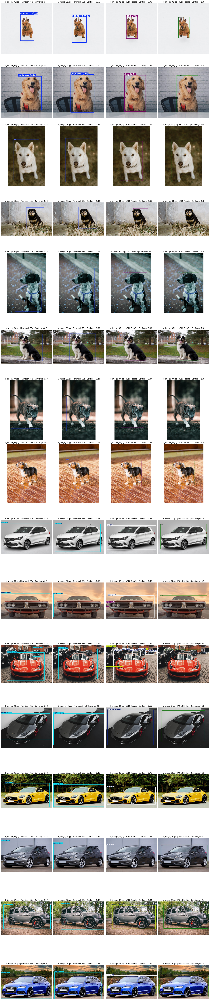

In [23]:
num_images = len(images)

fig, axes = plt.subplots(num_images, 4, figsize=(20, 6 * num_images))

for i in range(num_images):
    try:
        img_ft1 = pil.Image.open(f'{FT_D1_PATH}/{images[i]}')
        axes[i, 0].imshow(img_ft1)
        axes[i, 0].set_title(f'{images[i]} | Farmtech 35e | Confiança {round(farmtech_test_1[i], 2):}')
        axes[i, 0].axis('off')
    except:
        pass

    try:
        img_ft2 = pil.Image.open(f'{FT_D2_PATH}/{images[i]}')
        axes[i, 1].imshow(img_ft2)
        axes[i, 1].set_title(f'{images[i]} | Farmtech 55e | Confiança {round(farmtech_test_2[i], 2)}')
        axes[i, 1].axis('off')
    except:
        pass

    try:
        img_yp0 = pil.Image.open(f'{YP_D0_PATH}/{images[i]}')
        axes[i, 2].imshow(img_yp0)
        axes[i, 2].set_title(f'{images[i]} | YOLO Padrão | Confiança {round(yolo_test_1[i], 2):}')
        axes[i, 2].axis('off')
    except:
        pass

    try:
        img_tv0 = pil.Image.open(f'{TV_D0_PATH}/{images[i]}')
        axes[i, 3].imshow(img_tv0)
        axes[i, 3].set_title(f'{images[i]} | YOLO Padrão | Confiança {round(torchvision_test_1[i], 2):}')
        axes[i, 3].axis('off')
    except:
        pass

plt.tight_layout()
plt.show()